#Exercício
1 - Execute stable diffusion para transformar um texto em imagem usando o modelo pré-treinado: runwayml/stable-diffusion-v1-5

2 - Execute o mesmo prompt para transformar um texto em imagem usando outro modelo pré-treinado.

3 - Fixe uma semente aleatória e gere uma imagem com guidance_scale=2 e outra imagem com guidance_scale=30. Qual a diferença entre elas?

4 - Execute um prompt para transformar texto em imagem usando num_inference_steps=5 e um prompt para transformar texto em imagem usando num_inference_steps=100. Qual a direfença?

5 - Monte um grid de imagens de um mesmo prompt.

6 - Use o modelo pré-treinado stabilityai/stable-diffusion-x4-upscaler para aumentar a resolução de uma imagem. Faça uma captura de tela mostrando as diferenças.

7 - Gere uma nova imagem a partir de uma imagem existente.

In [ ]:
pip install diffusers transformers scipy safetensors ftfy

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.3/1.3 MB 20.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.5/7.5 MB 91.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.3/1.3 MB 80.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 53.1/53.1 kB 6.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 268.8/268.8 kB 33.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.8/7.8 MB 80.7 MB/s eta 0:00:00


In [ ]:
import torch
from diffusers import StableDiffusionPipeline

The cache for model files in Transformers v4.22.0 has been updated. Migrating your old cache. This is a one-time only operation. You can interrupt this and resume the migration later on by calling `transformers.utils.move_cache()`.


0it [00:00, ?it/s]

#Atividade 1

In [ ]:
pipe = StableDiffusionPipeline.from_pretrained("runwayml/stable-diffusion-v1-5", torch_dtype=torch.float16)
pipe = pipe.to("cuda")

Fetching 15 files:   0%|          | 0/15 [00:00<?, ?it/s]

Cannot initialize model with low cpu memory usage because `accelerate` was not found in the environment. Defaulting to `low_cpu_mem_usage=False`. It is strongly recommended to install `accelerate` for faster and less memory-intense model loading. You can do so with: 
```
pip install accelerate
```
.


Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

`text_config_dict` is provided which will be used to initialize `CLIPTextConfig`. The value `text_config["id2label"]` will be overriden.
`text_config_dict` is provided which will be used to initialize `CLIPTextConfig`. The value `text_config["bos_token_id"]` will be overriden.
`text_config_dict` is provided which will be used to initialize `CLIPTextConfig`. The value `text_config["eos_token_id"]` will be overriden.


  0%|          | 0/50 [00:00<?, ?it/s]

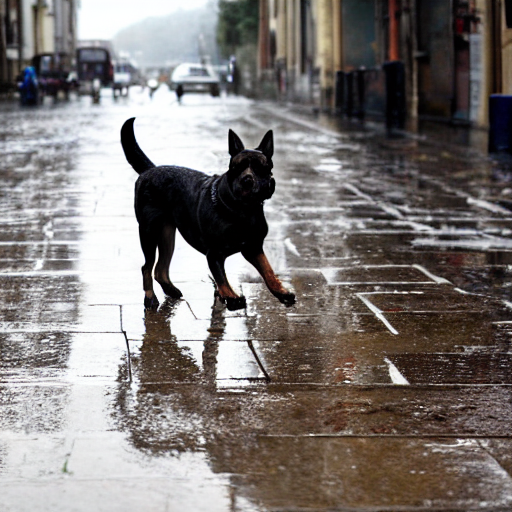

In [ ]:
prompt = "A dog in a wet street"
image = pipe(prompt).images[0]
image

#Atividade 2

In [ ]:
pipe2 = StableDiffusionPipeline.from_pretrained("stabilityai/stable-diffusion-2-1", torch_dtype=torch.float16)
pipe2 = pipe2.to("cuda")

Cannot initialize model with low cpu memory usage because `accelerate` was not found in the environment. Defaulting to `low_cpu_mem_usage=False`. It is strongly recommended to install `accelerate` for faster and less memory-intense model loading. You can do so with: 
```
pip install accelerate
```
.


Loading pipeline components...:   0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

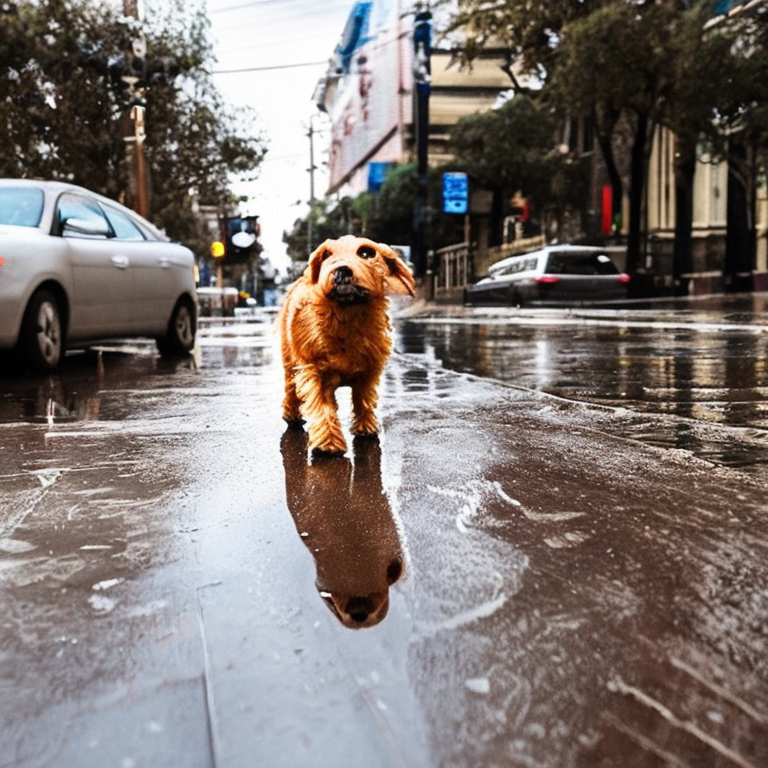

In [ ]:
prompt = "A dog in a wet street"
image = pipe2(prompt).images[0]
image

#Atividade 3

In [ ]:
generator = torch.Generator("cuda").manual_seed(333)

  0%|          | 0/50 [00:00<?, ?it/s]

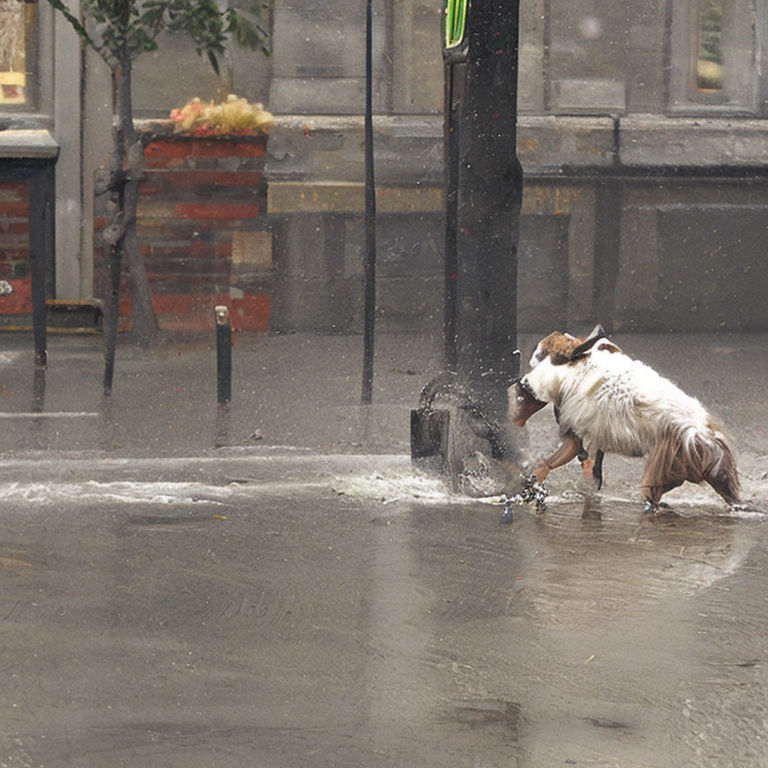

In [ ]:
prompt = "A dog in a wet street"
image = pipe2(prompt, guidance_scale=2, generator=generator).images[0]
image

  0%|          | 0/50 [00:00<?, ?it/s]

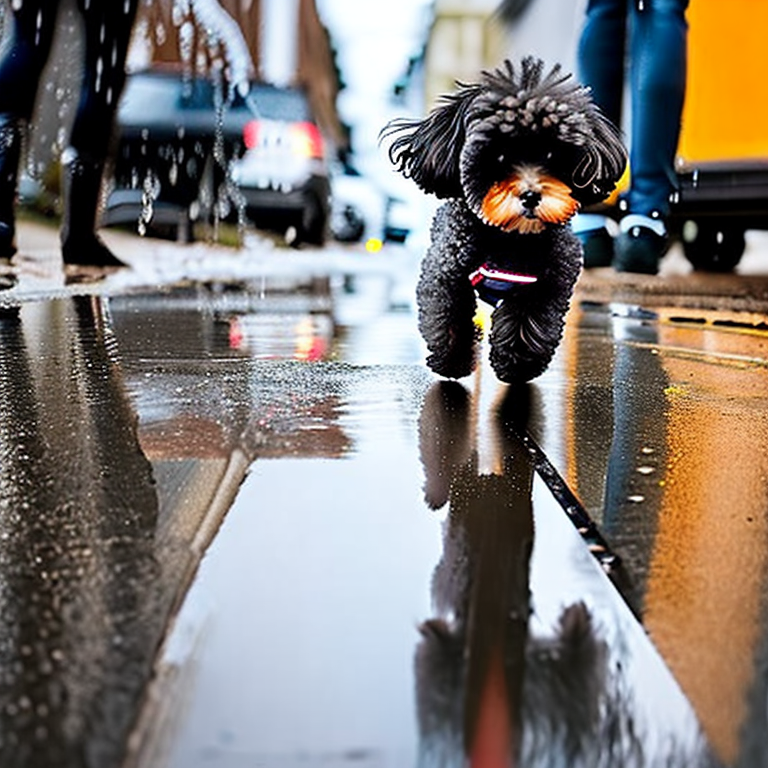

In [ ]:
prompt = "A dog in a wet street"
image = pipe2(prompt, guidance_scale=30, generator=generator).images[0]
image

#Atividade 4

  0%|          | 0/5 [00:00<?, ?it/s]

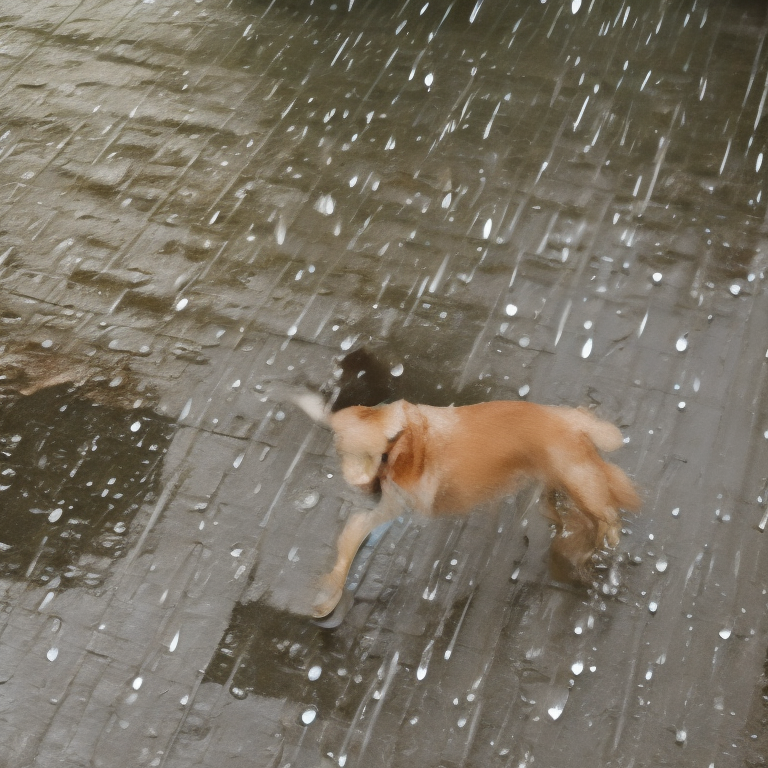

In [ ]:
prompt = "A dog in a wet street"
image = pipe2(prompt, num_inference_steps=5, generator=generator).images[0]
image

  0%|          | 0/100 [00:00<?, ?it/s]

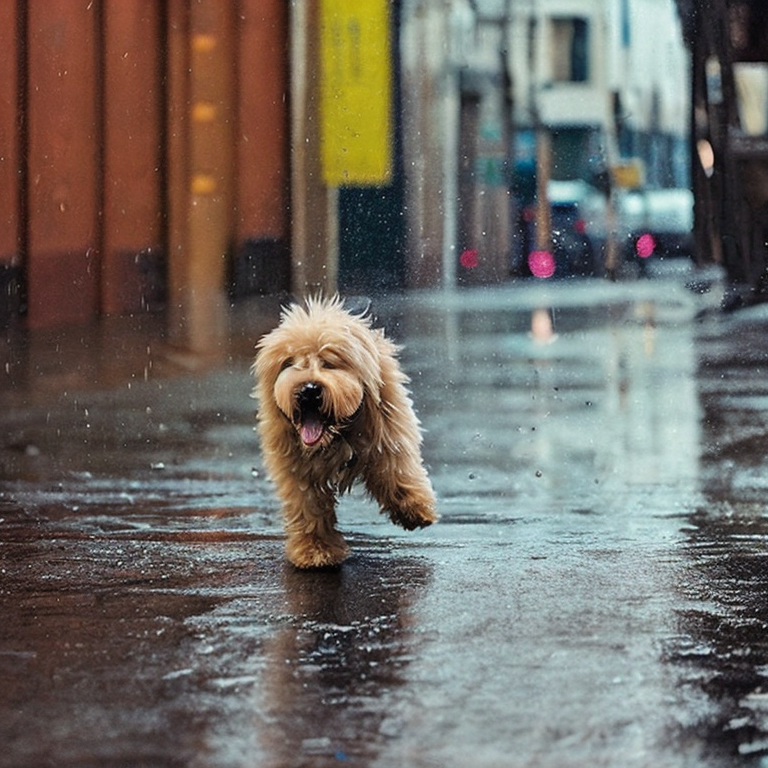

In [ ]:
prompt = "A dog in a wet street"
image = pipe2(prompt, num_inference_steps=100, generator=generator).images[0]
image

#Atividade 5

In [ ]:
from PIL import Image

def image_grid(imgs, rows, cols):
    assert len(imgs) == rows*cols

    w, h = imgs[0].size
    grid = Image.new('RGB', size=(cols*w, rows*h))
    grid_w, grid_h = grid.size

    for i, img in enumerate(imgs):
        grid.paste(img, box=(i%cols*w, i//cols*h))
    return grid

  0%|          | 0/100 [00:00<?, ?it/s]

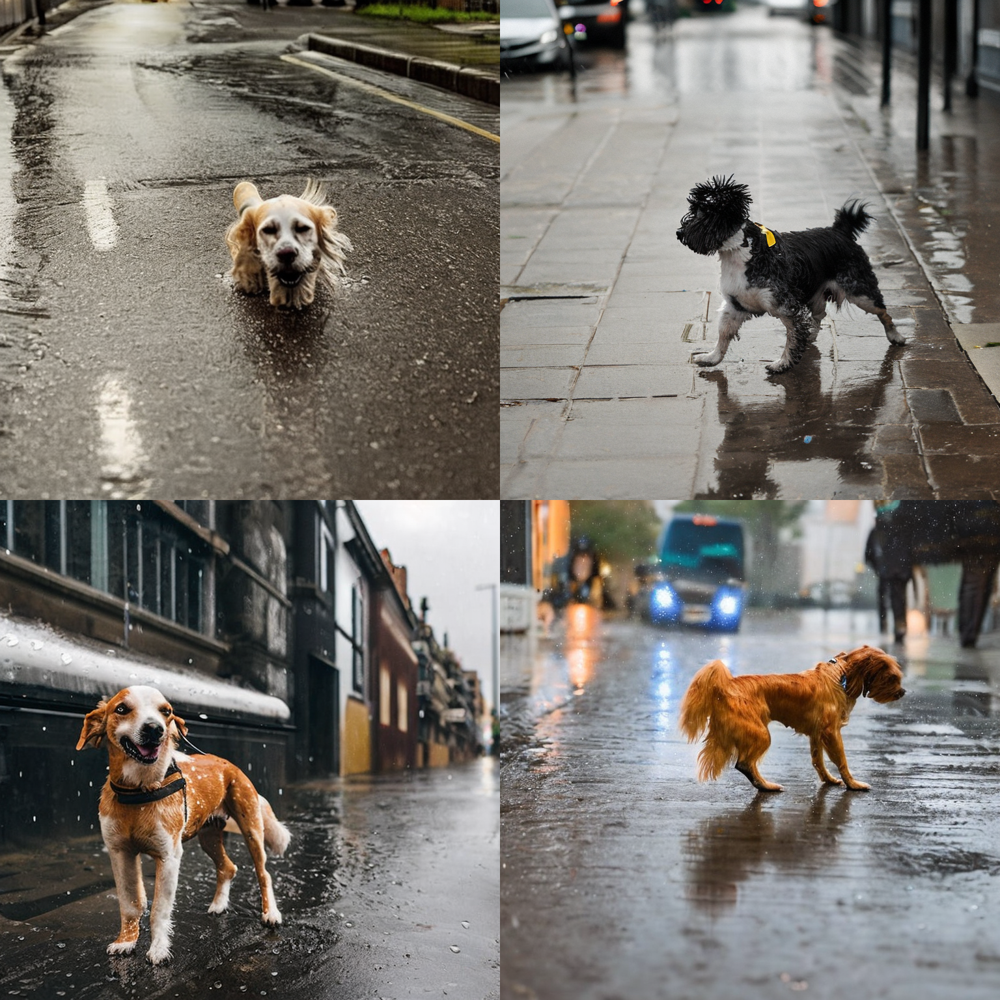

In [ ]:
num_images = 4
prompt = ["A dog in a wet street"] * num_images
images = pipe2(prompt, num_inference_steps=100, generator=generator).images
grid = image_grid(images, rows=2, cols=2)
grid

#Atividade 6

In [ ]:
import requests
from diffusers import StableDiffusionUpscalePipeline
from io import BytesIO

In [ ]:
# load model and scheduler
model_id = "stabilityai/stable-diffusion-x4-upscaler"
pipeline = StableDiffusionUpscalePipeline.from_pretrained(model_id, torch_dtype=torch.float16)
pipeline = pipeline.to("cuda")

Fetching 13 files:   0%|          | 0/13 [00:00<?, ?it/s]

Cannot initialize model with low cpu memory usage because `accelerate` was not found in the environment. Defaulting to `low_cpu_mem_usage=False`. It is strongly recommended to install `accelerate` for faster and less memory-intense model loading. You can do so with: 
```
pip install accelerate
```
.


Loading pipeline components...:   0%|          | 0/6 [00:00<?, ?it/s]

In [ ]:
from PIL import Image

In [ ]:
# let's download an  image
url = "https://matthews.sites.wfu.edu/misc/graphics/ResVsComp/25percent4x4.png"
response = requests.get(url)
low_res_img = Image.open(BytesIO(response.content)).convert("RGB")
low_res_img = low_res_img.resize((188, 122))

prompt = "a man with red black shirt"

upscaled_image = pipeline(prompt=prompt, image=low_res_img).images[0]
upscaled_image.save("men.png")

  0%|          | 0/75 [00:00<?, ?it/s]